In [1]:
import pandas as pd
from tabulate import tabulate

df = pd.read_csv('Trades_ink_ga.csv', delimiter=';')

# Display the first few rows of the DataFrame
# df.head(20)
print(tabulate(df, headers='keys'))

        day    timestamp  product             bid_price_1    bid_volume_1    bid_price_2    bid_volume_2    bid_price_3    bid_volume_3    ask_price_1    ask_volume_1    ask_price_2    ask_volume_2    ask_price_3    ask_volume_3    mid_price    profit_and_loss
----  -----  -----------  ----------------  -------------  --------------  -------------  --------------  -------------  --------------  -------------  --------------  -------------  --------------  -------------  --------------  -----------  -----------------
   0      1            0  SQUID_INK                  1834              23            nan             nan            nan             nan           1838              23            nan             nan            nan             nan       1836             0
   1      1            0  RAINFOREST_RESIN           9998               9           9995              23            nan             nan          10005              23            nan             nan            nan            

In [2]:
import pandas as pd
from tabulate import tabulate

#df_kelp_0 = pd.read_csv('prices_round_1_day_0.csv', delimiter=';')
df_ink_0 = pd.read_csv('prices_round_1_day_0.csv', delimiter=';')

print(tabulate(df_ink_0, headers='keys'))

         day    timestamp  product             bid_price_1    bid_volume_1    bid_price_2    bid_volume_2    bid_price_3    bid_volume_3    ask_price_1    ask_volume_1    ask_price_2    ask_volume_2    ask_price_3    ask_volume_3    mid_price    profit_and_loss
-----  -----  -----------  ----------------  -------------  --------------  -------------  --------------  -------------  --------------  -------------  --------------  -------------  --------------  -------------  --------------  -----------  -----------------
    0      0            0  RAINFOREST_RESIN           9998               1           9995              30            nan             nan          10005              30            nan             nan            nan             nan      10001.5                  0
    1      0            0  KELP                       2028              30            nan             nan            nan             nan           2032              30            nan             nan            nan 

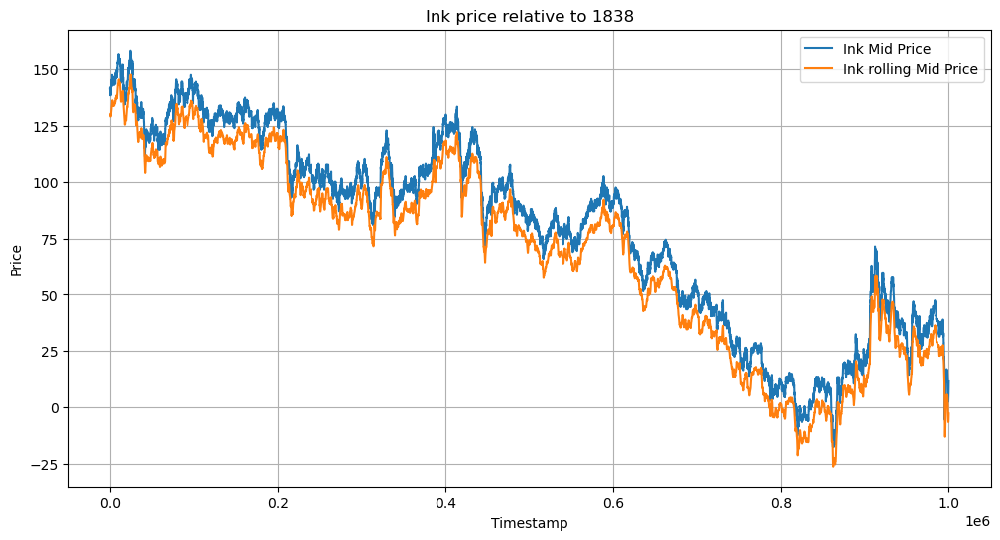

In [3]:
import matplotlib.pyplot as plt

df_ink = df_ink_0[df_ink_0['product'] == 'SQUID_INK']
df_kelp = df_ink_0[df_ink_0['product'] == 'KELP']

df_ink_mid = [(x - 1828) for x in df_ink['mid_price']]
df_ink_rolling_mid = [(x - 1838) for x in df_ink['mid_price'].rolling(window=5).mean()]

# Plot Ink price relative to 1838

plt.figure(figsize=(12, 6))
plt.plot(df_ink['timestamp'], df_ink_mid, label='Ink Mid Price')
plt.plot(df_ink['timestamp'], df_ink_rolling_mid, label='Ink rolling Mid Price')
plt.xlabel('Timestamp')
plt.ylabel('Price')
plt.title('Ink price relative to 1838')
plt.legend()
plt.grid(True)
plt.show()

In [4]:
import numpy as np
import math

bid_price_1 = list(df_ink['bid_price_1'])
bid_volume_1 = list(df_ink['bid_volume_1'])

bid_price_2 = list(df_ink['bid_price_2'])
bid_volume_2 = list(df_ink['bid_volume_2'])

bid_price_3 = list(df_ink['bid_price_3'])
bid_volume_3 = list(df_ink['bid_volume_3'])

ask_price_1 = list(df_ink['ask_price_1'])
ask_volume_1 = list(df_ink['ask_volume_1'])

ask_price_2 = list(df_ink['ask_price_2'])
ask_volume_2 = list(df_ink['ask_volume_2'])

ask_price_3 = list(df_ink['ask_price_3'])
ask_volume_3 = list(df_ink['ask_volume_3'])

mid_weight_ink = []

for i in range(len(bid_price_1)):
    total_weight = 0
    mid_weight_curr = 0
    if not math.isnan(bid_price_1[i]):
        mid_weight_curr += bid_price_1[i] * bid_volume_1[i]
        total_weight += bid_volume_1[i]
    
    if not math.isnan(bid_price_2[i]):
        mid_weight_curr += bid_price_2[i] * bid_volume_2[i]
        total_weight += bid_volume_2[i]
    
    if not math.isnan(bid_price_3[i]):
        mid_weight_curr += bid_price_3[i] * bid_volume_3[i]
        total_weight += bid_volume_3[i]

    if not math.isnan(ask_price_1[i]):
        mid_weight_curr += ask_price_1[i] * ask_volume_1[i]
        total_weight += ask_volume_1[i]
    
    if not math.isnan(ask_price_2[i]):
        mid_weight_curr += ask_price_2[i] * ask_volume_2[i]
        total_weight += ask_volume_2[i]
    
    if not math.isnan(ask_price_3[i]):
        mid_weight_curr += ask_price_3[i] * ask_volume_3[i]
        total_weight += ask_volume_3[i]

    mid_weight_ink.append(mid_weight_curr / total_weight if total_weight != 0 else 0)
    


In [10]:
import numpy as np
import math

bid_price_1 = list(df_kelp['bid_price_1'])
bid_volume_1 = list(df_kelp['bid_volume_1'])

bid_price_2 = list(df_kelp['bid_price_2'])
bid_volume_2 = list(df_kelp['bid_volume_2'])

bid_price_3 = list(df_kelp['bid_price_3'])
bid_volume_3 = list(df_kelp['bid_volume_3'])

ask_price_1 = list(df_kelp['ask_price_1'])
ask_volume_1 = list(df_kelp['ask_volume_1'])

ask_price_2 = list(df_kelp['ask_price_2'])
ask_volume_2 = list(df_kelp['ask_volume_2'])

ask_price_3 = list(df_kelp['ask_price_3'])
ask_volume_3 = list(df_kelp['ask_volume_3'])

mid_weight_kelp = []

for i in range(len(bid_price_1)):
    total_weight = 0
    mid_weight_curr = 0
    if not math.isnan(bid_price_1[i]):
        mid_weight_curr += bid_price_1[i] * bid_volume_1[i]
        total_weight += bid_volume_1[i]
    
    if not math.isnan(bid_price_2[i]):
        mid_weight_curr += bid_price_2[i] * bid_volume_2[i]
        total_weight += bid_volume_2[i]
    
    if not math.isnan(bid_price_3[i]):
        mid_weight_curr += bid_price_3[i] * bid_volume_3[i]
        total_weight += bid_volume_3[i]

    if not math.isnan(ask_price_1[i]):
        mid_weight_curr += ask_price_1[i] * ask_volume_1[i]
        total_weight += ask_volume_1[i]
    
    if not math.isnan(ask_price_2[i]):
        mid_weight_curr += ask_price_2[i] * ask_volume_2[i]
        total_weight += ask_volume_2[i]
    
    if not math.isnan(ask_price_3[i]):
        mid_weight_curr += ask_price_3[i] * ask_volume_3[i]
        total_weight += ask_volume_3[i]

    mid_weight_kelp.append(mid_weight_curr / total_weight if total_weight != 0 else 0)

C:\Users\amino\AppData\Local\Temp\ipykernel_13276\2006919105.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


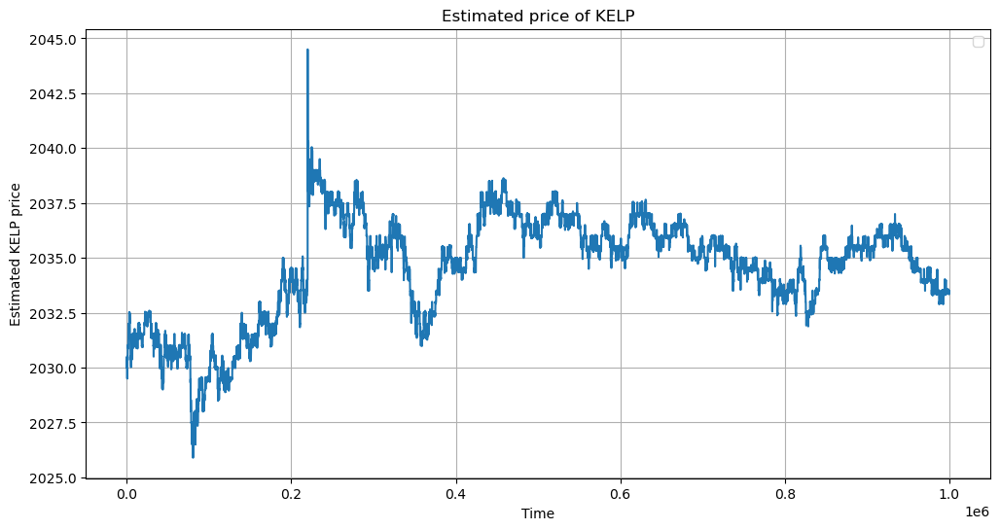

C:\Users\amino\AppData\Local\Temp\ipykernel_13276\2006919105.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


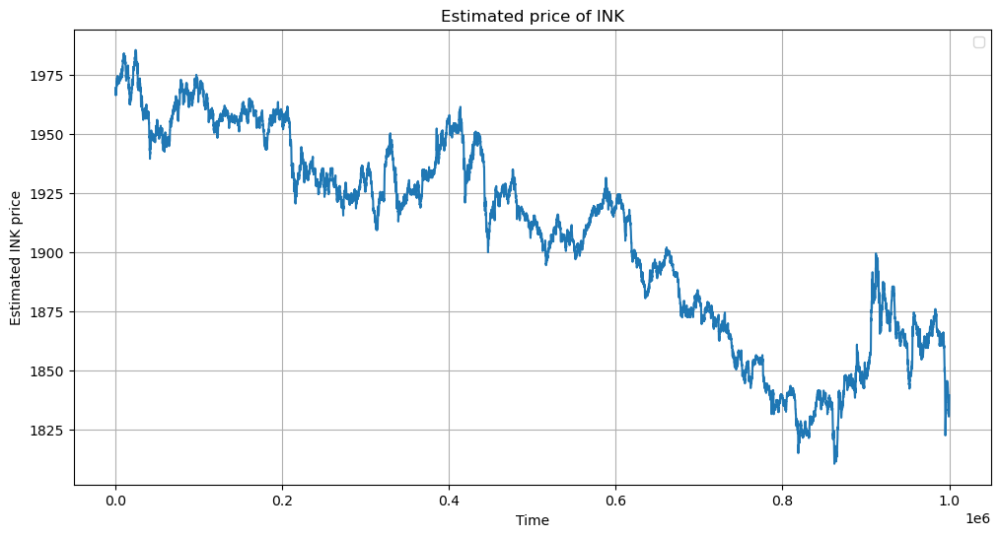

In [11]:
df_ink_weighted_mid = [(x) for x in mid_weight_ink]
df_kelp_weighted_mid = [(x) for x in mid_weight_kelp]

time_lst = list(df_ink['timestamp'])

plt.figure(figsize=(12, 6))
plt.plot(time_lst,df_kelp_weighted_mid)
plt.xlabel('Time')
plt.ylabel('Estimated KELP price')
plt.title('Estimated price of KELP')
plt.legend()
plt.grid(True)
#plt.xlim(0, 200000)
#plt.ylim(1940, 2000)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(time_lst,df_ink_weighted_mid)
plt.xlabel('Time')
plt.ylabel('Estimated INK price')
plt.title('Estimated price of INK')
plt.legend()
plt.grid(True)
#plt.xlim(0, 200000)
#plt.ylim(1940, 2000)
plt.show()


C:\Users\amino\AppData\Local\Temp\ipykernel_13276\1545988613.py:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


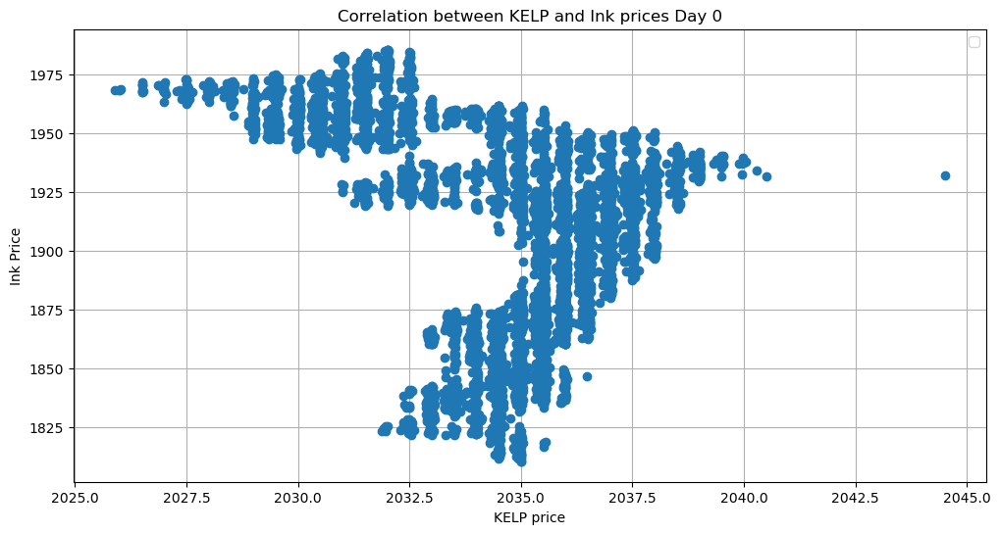

In [12]:
#shift = 1
#df_kelp_price_shift = df_kelp_price[shift:]

#df_ink_lst = list(df_ink['profit_and_loss'])
#df_ink_price_cut = df_ink_lst[:-shift]

plt.figure(figsize=(12, 6))
plt.plot(df_kelp_weighted_mid, df_ink_weighted_mid,'o')
plt.xlabel('KELP price')
plt.ylabel('Ink Price')
plt.title('Correlation between KELP and Ink prices Day 0')
plt.legend()
plt.grid(True)
#plt.xlim(2028,2038)
plt.show()

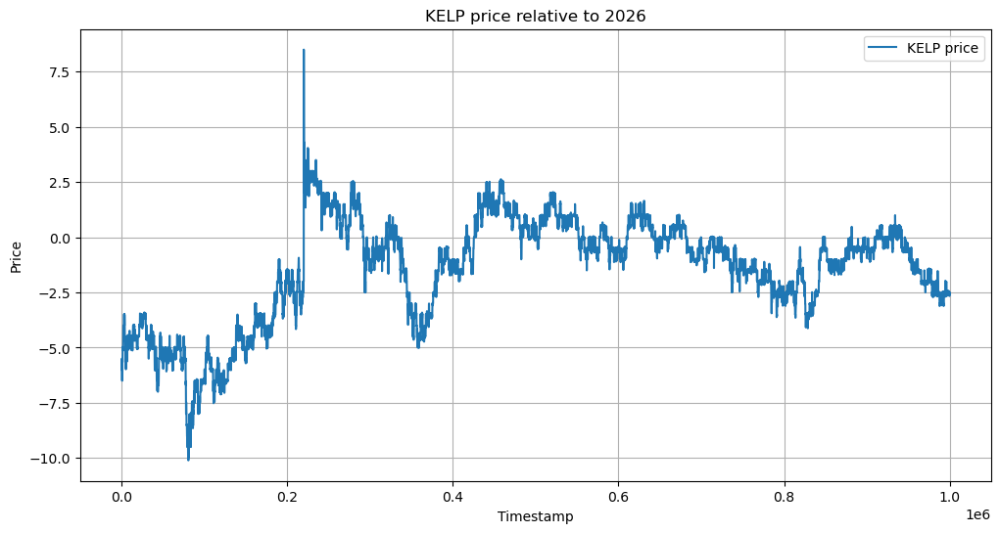

In [20]:

plt.figure(figsize=(12, 6))
plt.plot(df_kelp['timestamp'], [ x - 2036 for x in df_kelp_weighted_mid], label='KELP price')
#plt.plot(df_ink['timestamp'], df_ink_weighted_mid)
plt.xlabel('Timestamp')
plt.ylabel('Price')
plt.title('KELP price relative to 2026')
plt.legend()
plt.grid(True)
plt.show()


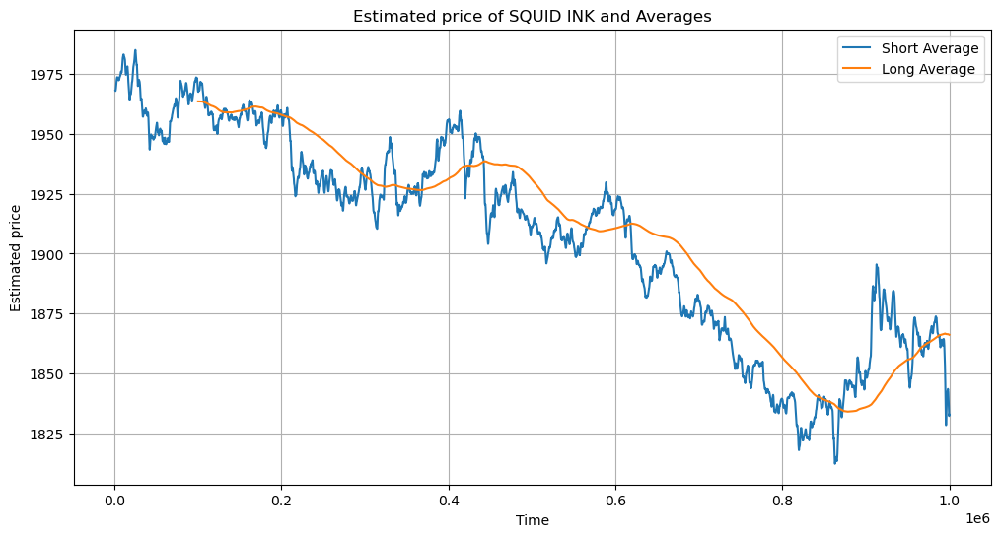

C:\Users\amino\AppData\Local\Temp\ipykernel_13276\1354056763.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


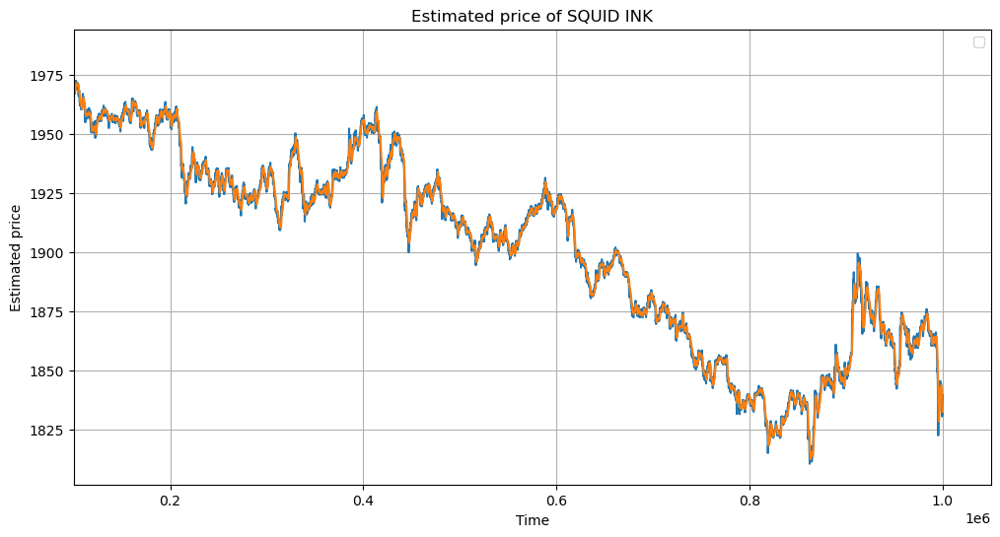

In [44]:
len_long = 1000
len_short = 10

df_ink_weighted_mid = [(x) for x in mid_weight_ink]
time_lst = list(df_ink['timestamp'])

average_long = []
time_long = []

average_short = []
time_short = []


for i in range(len_long,len(df_ink_weighted_mid)):
    average_long.append(sum(df_ink_weighted_mid[i-len_long:i]) / len_long)
    time_long.append(time_lst[i])

for i in range(len_short,len(df_ink_weighted_mid)):
    average_short.append(sum(df_ink_weighted_mid[i-len_short:i]) / len_short)
    time_short.append(time_lst[i])


plt.figure(figsize=(12, 6))
plt.plot(time_short,average_short, label='Short Average')
plt.plot(time_long,average_long, label='Long Average')
plt.xlabel('Time')
plt.ylabel('Estimated price')
plt.title('Estimated price of SQUID INK and Averages')
plt.legend()
plt.grid(True)
#plt.xlim(0, 200000)
#plt.ylim(1940, 2000)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(time_lst,df_ink_weighted_mid)
plt.plot(time_short,average_short)
plt.xlabel('Time')
plt.ylabel('Estimated price')
plt.title('Estimated price of SQUID INK')
plt.legend()
plt.grid(True)
plt.xlim(100000)
#plt.ylim(1925, 2000)
plt.show()

C:\Users\amino\AppData\Local\Temp\ipykernel_18908\4120324088.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


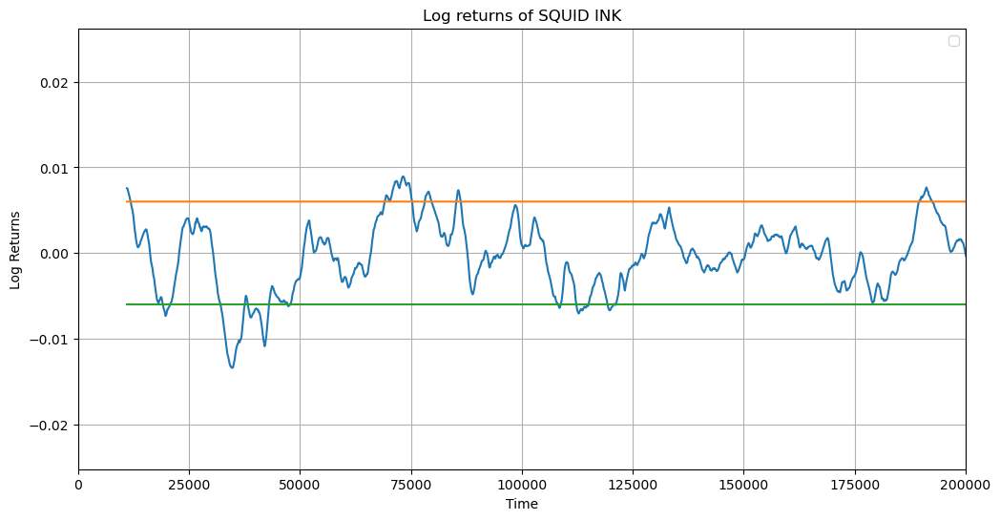

C:\Users\amino\AppData\Local\Temp\ipykernel_18908\4120324088.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


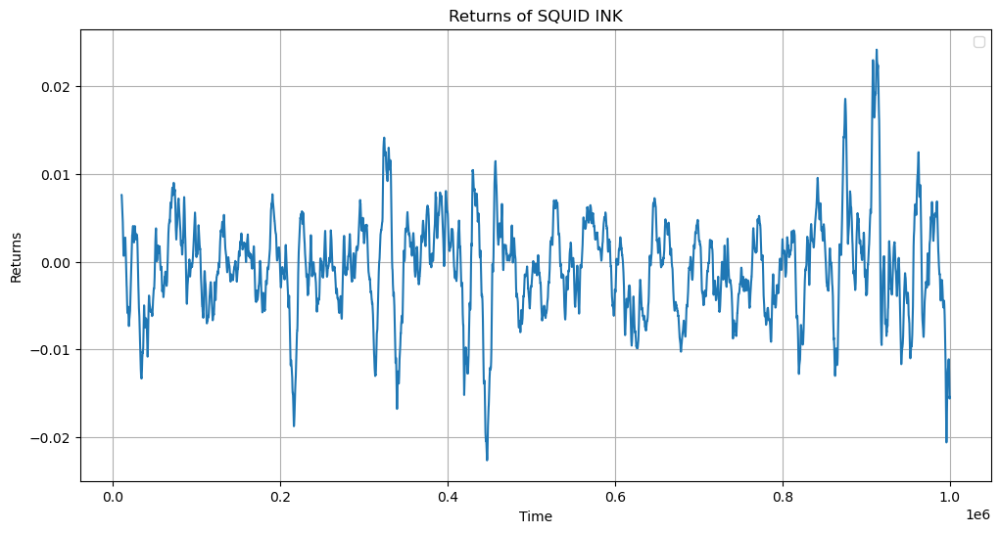

In [80]:

step = 100
log_returns = []
returns = []
time_returns = []

for i in range(step,len(average_short)):
    log_returns.append(math.log(average_short[i] / average_short[i-step]))
    returns.append((average_short[i] / average_short[i-step]) - 1)
    time_returns.append(time_short[i])

plt.figure(figsize=(12, 6))
plt.plot(time_returns,log_returns)
plt.plot(time_returns,[0.006 for i in range(len(log_returns))])
plt.plot(time_returns,[-0.006 for i in range(len(log_returns))])
plt.xlabel('Time')
plt.ylabel('Log Returns')
plt.title('Log returns of SQUID INK')
plt.legend()
plt.grid(True)
plt.xlim(0, 0.2 * 1000000)
#plt.ylim(1800, 1810)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(time_returns,returns)
plt.xlabel('Time')
plt.ylabel('Returns')
plt.title('Returns of SQUID INK')
plt.legend()
plt.grid(True)
#plt.xlim(0, 100000)
#plt.ylim(1800, 1810)
plt.show()

Log Stdev: 0.005615835903155834


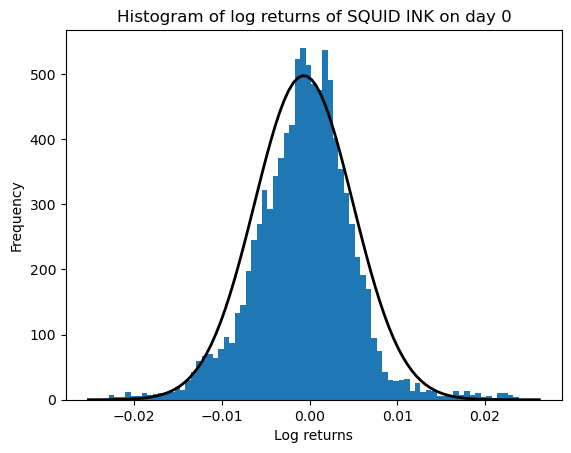

In [53]:
import statistics
from scipy.stats import norm
from scipy.stats import lognorm


log_mean = statistics.mean(log_returns)
log_stdev = statistics.stdev(log_returns)
print('Log Stdev:', log_stdev)

plt.hist(log_returns, bins=75)

# Normal distribution curve
x_min, x_max = plt.xlim()
x = np.linspace(x_min, x_max, 100)
p = norm.pdf(x, log_mean, log_stdev)
plt.plot(x, [7 * y for y in p], 'k', linewidth=2)

plt.xlabel('Log returns')
plt.ylabel('Frequency')
plt.title('Histogram of log returns of SQUID INK on day 0')
plt.show()



C:\Users\amino\AppData\Local\Temp\ipykernel_13276\3639297227.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


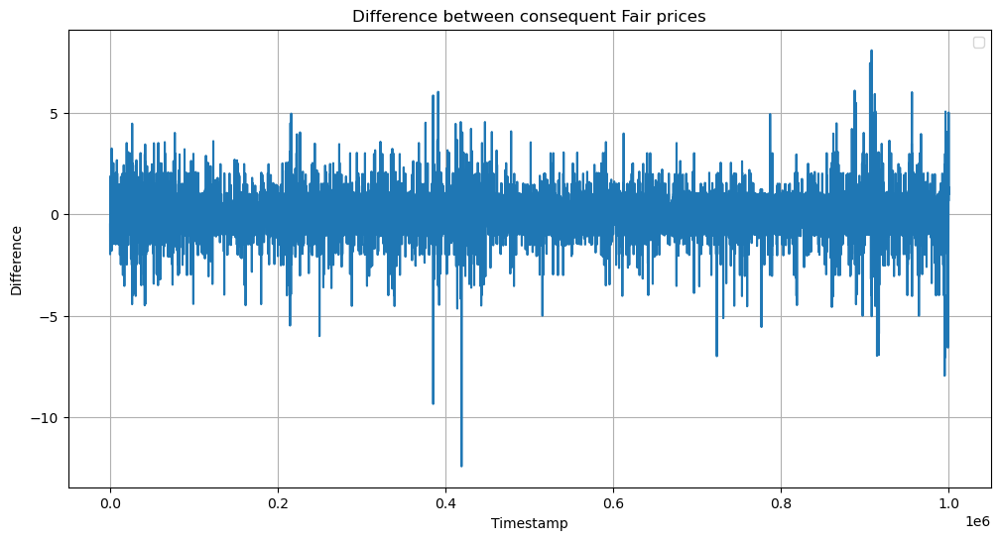

In [41]:
import statistics
time_ink = list(df_ink['timestamp'])
fprice_ink = df_ink_weighted_mid

fprice_ink_diff = [fprice_ink[i] - fprice_ink[i-1] for i in range(1,len(fprice_ink))]
time = [time_ink[i] for i in range(1,len(time_ink))]

plt.figure(figsize=(12, 6))
plt.plot(time, fprice_ink_diff)
plt.xlabel('Timestamp')
plt.ylabel('Difference')
plt.title('Difference between consequent Fair prices')
plt.legend()
plt.grid(True)
#plt.ylim(-2.5, 2.5)
plt.show()

-0.013001300130013 1.1165731140269035


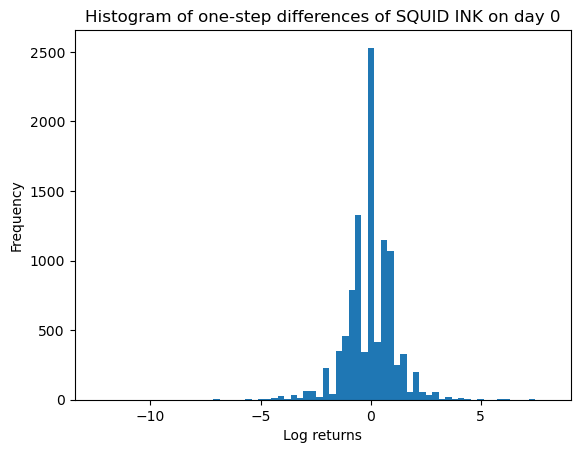

In [40]:
import statistics
from scipy.stats import norm
from scipy.stats import lognorm


#log_mean = statistics.mean(log_returns)
#log_stdev = statistics.stdev(log_returns)
#print('Log Stdev:', log_stdev)
print(statistics.mean(fprice_ink_diff), statistics.stdev(fprice_ink_diff))

plt.hist(fprice_ink_diff, bins=70)

# Normal distribution curve
#x_min, x_max = plt.xlim()
#x = np.linspace(x_min, x_max, 100)
#p = norm.pdf(x, log_mean, log_stdev)
#plt.plot(x, [7 * y for y in p], 'k', linewidth=2)

plt.xlabel('Log returns')
plt.ylabel('Frequency')
plt.title('Histogram of one-step differences of SQUID INK on day 0')
plt.show()

C:\Users\amino\AppData\Local\Temp\ipykernel_23620\1053965769.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


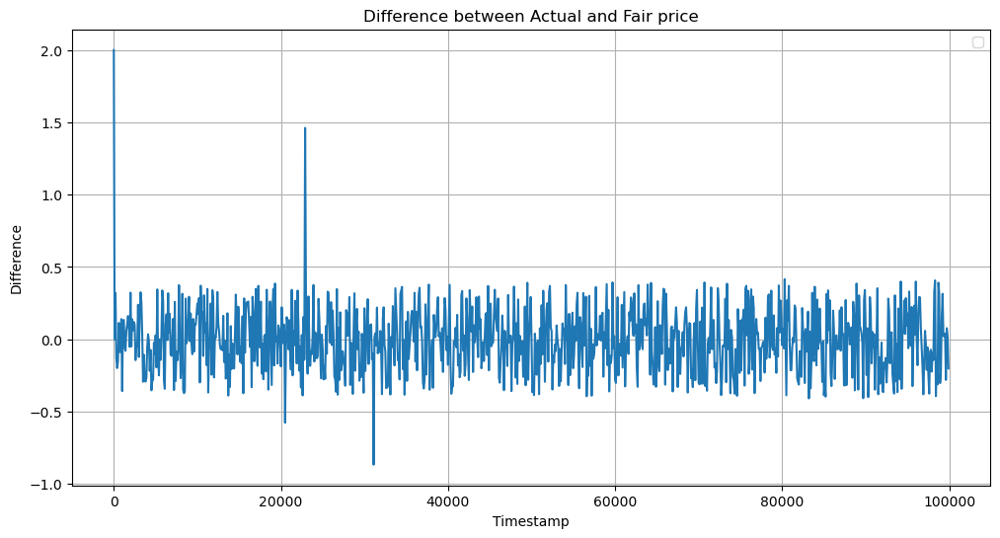

In [72]:
actual_fprice_diff = [df_ink_actual_price[i] - fprice_lst[i] for i in range(len(fprice_lst))]
time_ink = df_ink['timestamp']

plt.figure(figsize=(12, 6))
plt.plot(time_ink, actual_fprice_diff)
plt.xlabel('Timestamp')
plt.ylabel('Difference')
plt.title('Difference between Actual and Fair price')
plt.legend()
plt.grid(True)
plt.show()


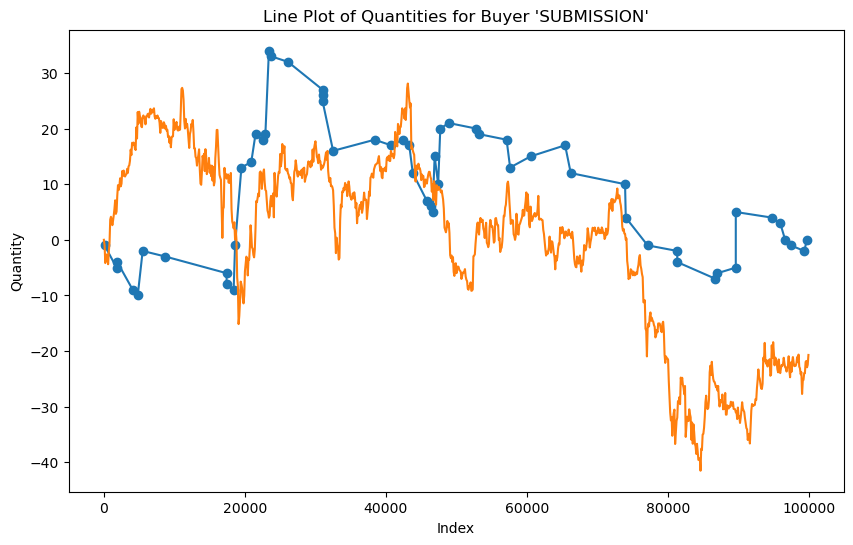

In [112]:
import json
import matplotlib.pyplot as plt

filename = "Log_ink_ga.log"
json_str = ""
found = False

with open(filename, "r") as f:
    # Read lines until we find the marker "Trade History:"
    for line in f:
        if "Trade History:" in line:
            # If the same line contains the opening bracket, use it
            if "[" in line:
                json_str = line[line.find("["):]
            else:
                # Otherwise, assume the next line starts the JSON array
                json_str = next(f)
            found = True
            break

    if not found:
        raise ValueError("Could not find 'Trade History:' with '[' in file.")

    # Append the remainder of the file to the JSON string
    json_str += f.read()

# Parse the JSON string into a list of trade objects
data = json.loads(json_str)

# Calculate the total quantity and total money paid for buyer "SUBMISSION"
quantities = []
time_lst = []
quantity = 0
for item in data:
    if item.get("buyer") == "SUBMISSION":
        quantity += item.get("quantity", 0)
        quantities.append(quantity)
        timestamp = item.get("timestamp", 0)
        time_lst.append(timestamp)
    elif item.get("seller") == "SUBMISSION":
        quantity -= item.get("quantity", 0)
        quantities.append(quantity)
        timestamp = item.get("timestamp", 0)
        time_lst.append(timestamp)

# Plot the quantities as a line plot
plt.figure(figsize=(10, 6))
plt.plot(time_lst, quantities, marker='o', linestyle='-')
plt.plot(df_ink['timestamp'], df_ink['profit_and_loss'])
plt.xlabel("Index")
plt.ylabel("Quantity")
plt.title("Line Plot of Quantities for Buyer 'SUBMISSION'")
plt.show()

In [111]:
ind = 40

time_ink = list(df_ink['timestamp'])

print('Time = ',time_ink[ind])
print('Fair and predicted prices: ',[fprice_lst[ind],df_ink_actual_price[ind]])

print('Max bid price and volume: ',[bid_price_1[ind],bid_volume_1[ind]])
print('Min ask price and volume: ',[ask_price_1[ind],ask_volume_1[ind]])

Time =  4000
Fair and predicted prices:  [1855.5, 1855.4503173828125]
Max bid price and volume:  [1854, 30]
Min ask price and volume:  [1857, 31]
